In [1]:
!ls -l /content/drive/MyDrive/colab/input/train | wc -l

26685


In [2]:
!pip install pyyaml==5.1
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html
!pip install pydicom
!pip install sklearn
!pip install funcy
!pip install argparse

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html
  Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


In [3]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu111 True


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import glob, os, json, cv2, random
from google.colab.patches import cv2_imshow
import pydicom as pyd
from sklearn.model_selection import train_test_split
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [5]:
base_dir='/content/drive/MyDrive/colab'
data_dir = base_dir+'/input'
working_dir = base_dir+'/working'

train_labels_df = pd.read_csv(data_dir+'/stage_2_train_labels.csv')
label_meta_data = pd.read_csv(data_dir+'/stage_2_detailed_class_info.csv')

train_dicom_dir = os.path.join(data_dir, 'stage_2_train_images')
test_dicom_dir = os.path.join(data_dir, 'stage_2_test_images')

train_labels_df.head(10)

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1
6,00569f44-917d-4c86-a842-81832af98c30,NaN,NaN,NaN,NaN,0
7,006cec2e-6ce2-4549-bffa-eadfcd1e9970,NaN,NaN,NaN,NaN,0
8,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1


In [6]:
def get_files(dicom_dir):
    files = glob.glob(dicom_dir+'/'+'*.dcm')
    return list(set(files))

def parse_dataset(dicom_dir, anns): 
    image_files = get_files(dicom_dir)
    image_annotations = {fp: [] for fp in image_files}
    for index, row in anns.iterrows(): 
        fp = os.path.join(dicom_dir, row['patientId']+'.dcm')
        image_annotations[fp].append(row)
        if index == 0:
          print(row)
    return image_files, image_annotations 

image_files, image_annotations = parse_dataset(train_dicom_dir, anns=train_labels_df)

patientId    0004cfab-14fd-4e49-80ba-63a80b6bddd6
x                                             NaN
y                                             NaN
width                                         NaN
height                                        NaN
Target                                          0
Name: 0, dtype: object


In [7]:
from detectron2.structures import BoxMode

def get_data_dicts(img_dir):
    dataset_dicts = []
    for idx, arr in enumerate(image_annotations.values()):
        record = {}
        filename = os.path.join(img_dir, arr[0]["patientId"]+".jpg")
        img = cv2.imread(filename)
        if img is None:
          continue;
        height, width = img.shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        objs = []
        for v in arr: 
          if np.isnan(float(v["x"])):
            continue
          obj = {
                  "bbox": [v["x"], v["y"], v["width"], v["height"]],
                  "bbox_mode": BoxMode.XYWH_ABS,
                  "category_id": 0,
              }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
          
        if idx > 1000:
          break;
    return dataset_dicts

### Create dataset and save

In [8]:
import json
out_file = open(os.path.join(data_dir,"coco.json"), "w")
json.dump(get_data_dicts(data_dir+'/train'), out_file, indent = 4) 
out_file.close()

### Split the dataset into train and validation

In [9]:
with open(os.path.join(data_dir,"coco.json"), 'r') as myfile:
    data=myfile.read()

# parse file
obj = json.loads(data)
 
X_train, X_val = train_test_split(obj, test_size=0.2)
print(len(X_train))
print(len(X_val))

801
201


In [10]:
def get_dicts(name):
    return X_train if name == 'train' else X_val

for d in ["train", "val"]:
    DatasetCatalog.register(d, lambda d=d: get_dicts(d))
    MetadataCatalog.get(d).set(thing_classes=["pneumonia"])

In [14]:
pnuemonia_metadata = MetadataCatalog.get("train")
print( MetadataCatalog.get("train"))

Metadata(name='train', thing_classes=['pneumonia'])


In [41]:
# def convert_to_jpg(input_file, output_file):
#     ds = pyd.dcmread(input_file)
#     cv2.imwrite(output_file, ds.pixel_array)

# for d in ["test"]:
#     input_path = os.path.join(data_dir, "stage_2_"+d+"_images")
   
#     for file in get_files(input_path):
#          output_file = os.path.join(data_dir, d, os.path.basename(file).replace(".dcm", "")+".jpg")
#          convert_to_jpg(file, output_file)

In [12]:
def show(d):  
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=pnuemonia_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

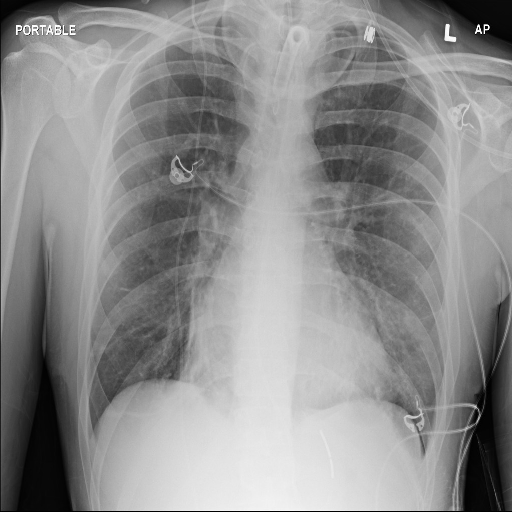

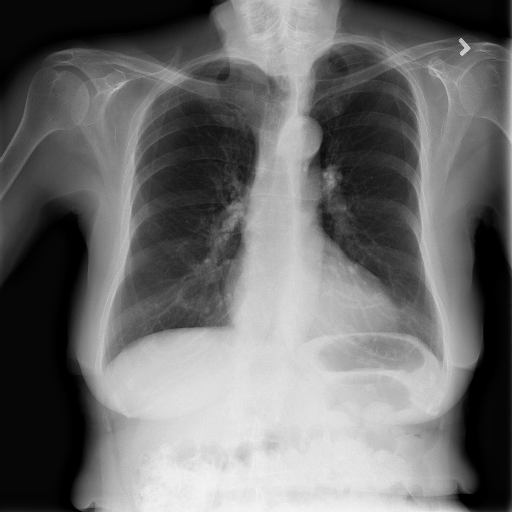

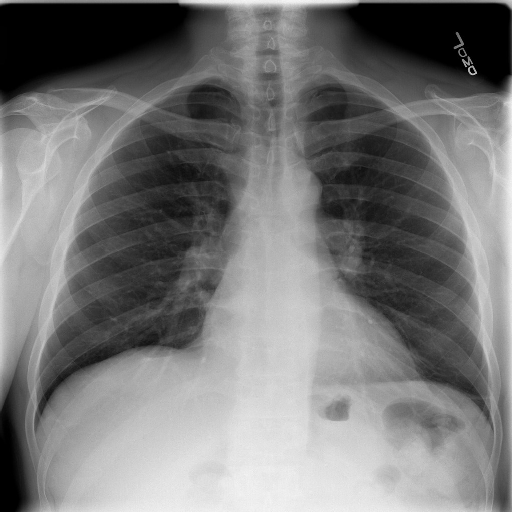

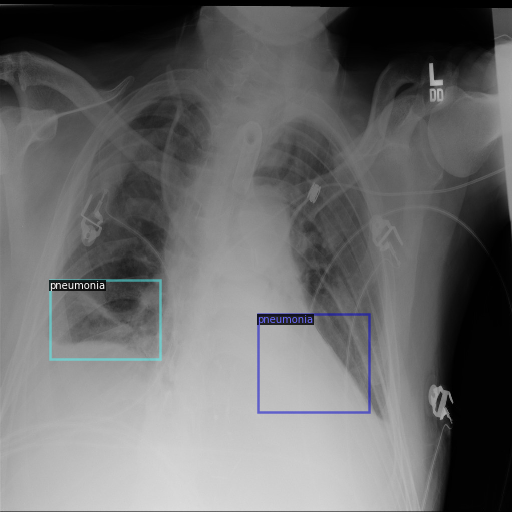

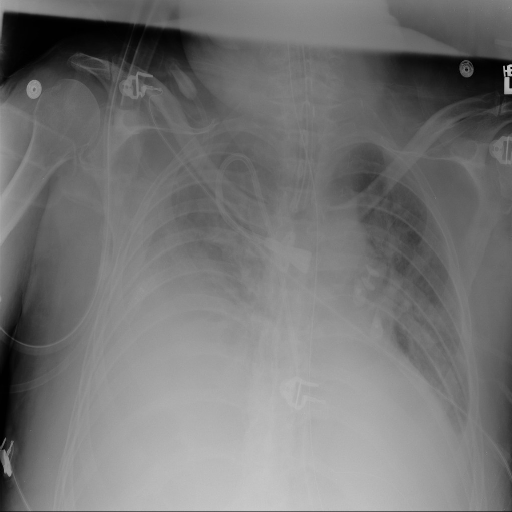

...

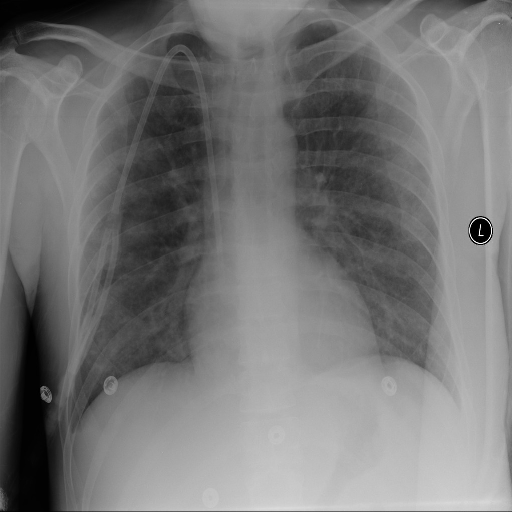

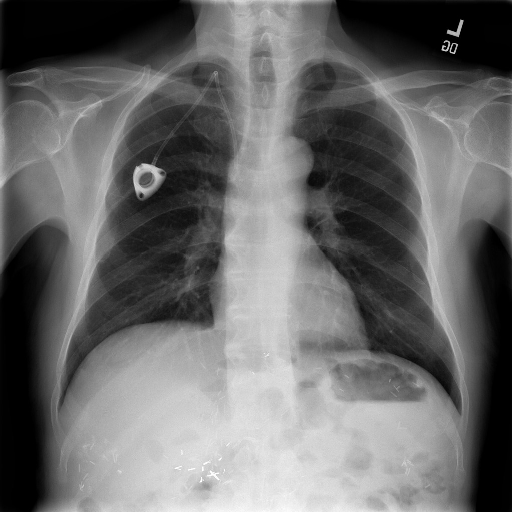

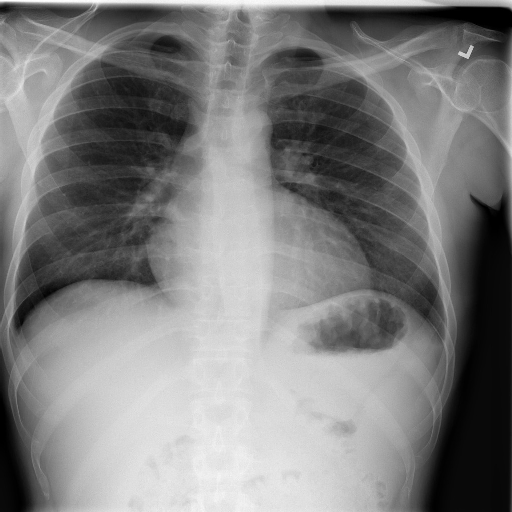

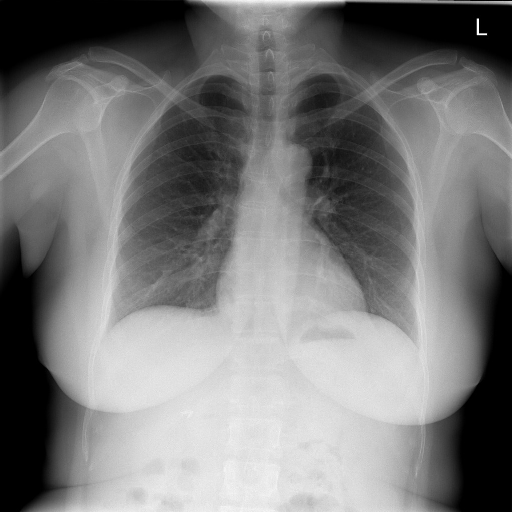

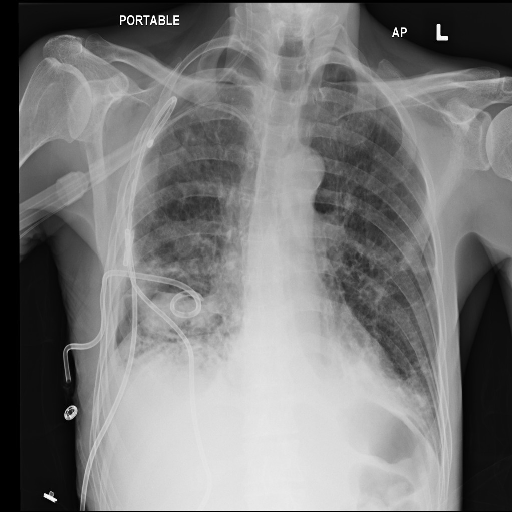

In [16]:
for d in random.sample(X_train, 15):
    show(d)

In [18]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_1x.yaml"))
cfg.DATASETS.TRAIN = ("train")
cfg.DATASETS.TEST = ()
cfg.OUTPUT_DIR = ( base_dir + "/output")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[10/24 14:26:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (2, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (4, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[10/24 14:26:12 d2.engine.train_loop]: Starting training from iteration 0
[10/24 14:26:18 d2.utils.events]:  eta: 0:01:20  iter: 19  total_loss: 1.44  loss_cls: 0.7494  loss_box_reg: 0.3567  loss_rpn_cls: 0.2669  loss_rpn_loc: 0.0413  time: 0.2868  data_time: 0.0120  lr: 1.6068e-05  max_mem: 2145M
[10/24 14:26:24 d2.utils.events]:  eta: 0:01:14  iter: 39  total_loss: 1.182  loss_cls: 0.5148  loss_box_reg: 0.3317  loss_rpn_cls: 0.2509  loss_rpn_loc: 0.03077  time: 0.2869  data_time: 0.0042  lr: 3.2718e-05  max_mem: 2145M
[10/24 14:26:30 d2.utils.events]:  eta: 0:01:09  iter: 59  total_loss: 0.9024  loss_cls: 0.3333  loss_box_reg: 0.3009  loss_rpn_cls: 0.2418  loss_rpn_loc: 0.02609  time: 0.2874  data_time: 0.0043  lr: 4.9367e-05  max_mem: 2145M
[10/24 14:26:36 d2.utils.events]:  eta: 0:01:03  iter: 79  total_loss: 1.006  loss_cls: 0.3685  loss_box_reg: 0.418  loss_rpn_cls: 0.2047  loss_rpn_loc: 0.0178  time: 0.2883  data_time: 0.0045  lr: 6.6017e-05  max_mem: 2145M
[10/24 14:26:41 d2.ut

In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model

In [20]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [33]:
result = [];
for d in X_val:      
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    no_objects = len(outputs["instances"].pred_boxes)

    predicted = 1 if no_objects > 0 else 0
    ground_truth = 1 if len(d["annotations"]) > 0 else 0
    result.append({"id":  os.path.basename(d["file_name"]).replace(".jpg", ""), "ground_truth": ground_truth, "predicted": predicted})



[{'id': '9e4f11c9-edcf-48bb-adce-0b06d7ddda3d', 'ground_truth': 0, 'predicted': 1}, {'id': '50ea28bf-b7f5-4b24-9d48-2144e4be21d0', 'ground_truth': 0, 'predicted': 1}, {'id': '84ccb61a-6dfe-4833-99fb-7a4c80a7393b', 'ground_truth': 0, 'predicted': 1}, {'id': 'db4601ab-e3a4-4f94-be20-65607e00aa6e', 'ground_truth': 0, 'predicted': 0}, {'id': '5882be25-40fc-49db-b4d5-3198385ade64', 'ground_truth': 0, 'predicted': 1}, {'id': '7a39e982-e5f1-402c-b9a8-b9ee5f43fb8c', 'ground_truth': 0, 'predicted': 0}, {'id': '622d6303-018b-4dcf-88b7-ac0b9e529a9f', 'ground_truth': 0, 'predicted': 1}, {'id': 'c8029b44-fbda-4ff3-bd78-68639a181cbd', 'ground_truth': 0, 'predicted': 1}, {'id': '15737cc0-fd06-4a89-9ce6-8b95bf0d6033', 'ground_truth': 0, 'predicted': 0}, {'id': 'edb834f7-7cbe-4f20-8563-85ae0a725f3f', 'ground_truth': 0, 'predicted': 1}, {'id': 'c3b14740-9eb7-4b20-a9ce-e404cce4b8c7', 'ground_truth': 0, 'predicted': 1}, {'id': 'f4e98c8f-b5f6-4e9d-9f9f-1d4694cad954', 'ground_truth': 0, 'predicted': 1}, {'i

In [35]:
df = pd.DataFrame(result)
df.head(100)

,id,ground_truth,predicted
0,9e4f11c9-edcf-48bb-adce-0b06d7ddda3d,0,1
1,50ea28bf-b7f5-4b24-9d48-2144e4be21d0,0,1
2,84ccb61a-6dfe-4833-99fb-7a4c80a7393b,0,1
3,db4601ab-e3a4-4f94-be20-65607e00aa6e,0,0
4,5882be25-40fc-49db-b4d5-3198385ade64,0,1
...,...,...,...
95,857c6181-8392-4a98-bb1f-f128c97ada7d,1,1
96,a3e9eaec-d502-4e5d-abc9-bb5e28742b83,1,1
97,12d2566d-fd1e-476c-8be4-68d15657d7d0,0,1
98,ad217b8d-1a8a-4347-871c-812febbde1e4,1,1


### Make Predictions

In [28]:
def get_test_files(dir):
    files = glob.glob(dir+'/'+'*.jpg')
    return list(set(files))


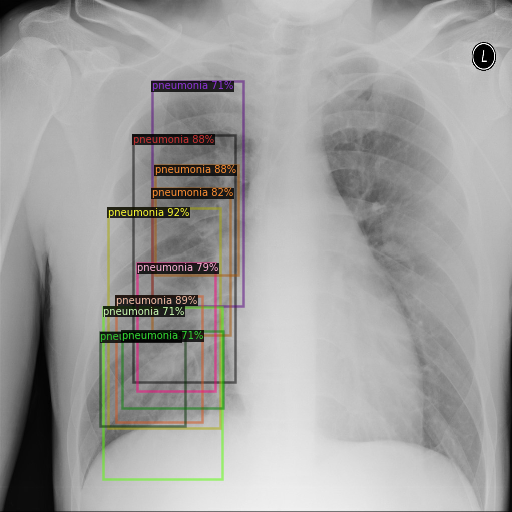

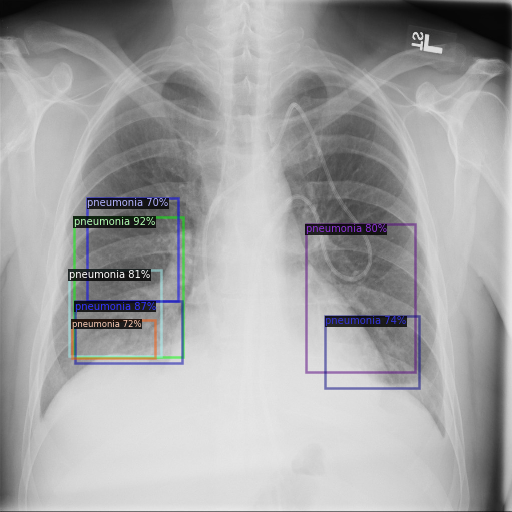

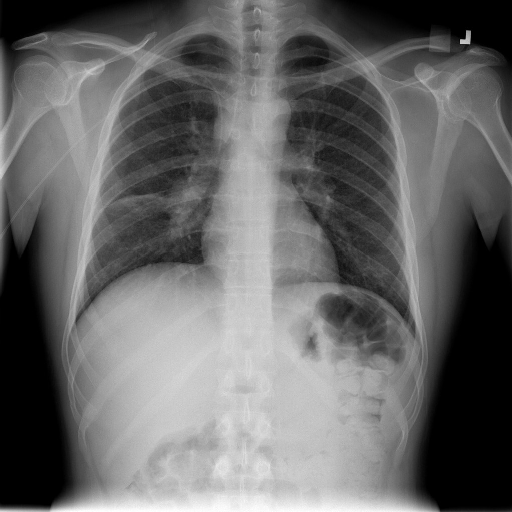

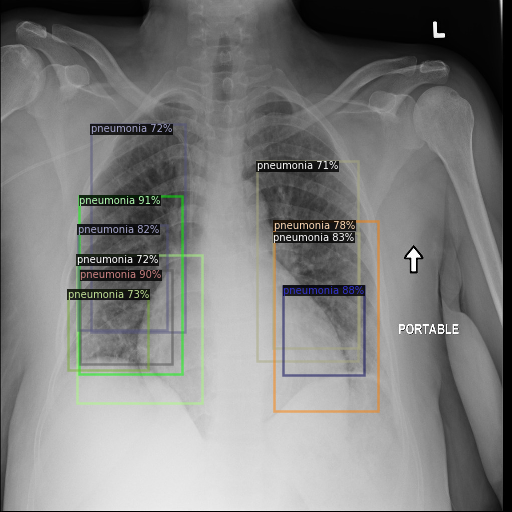

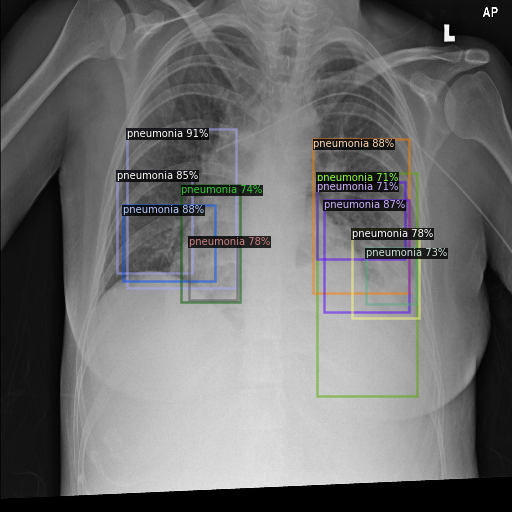

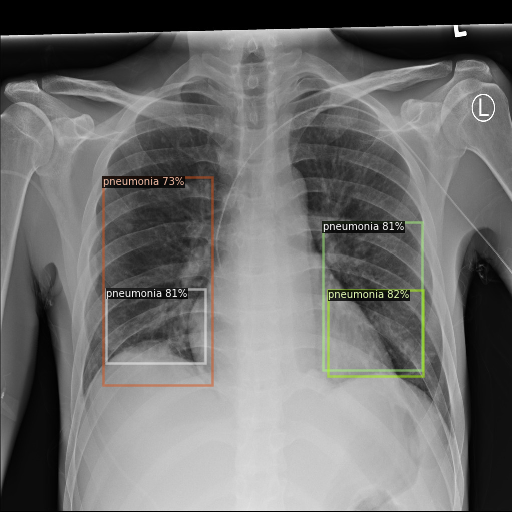

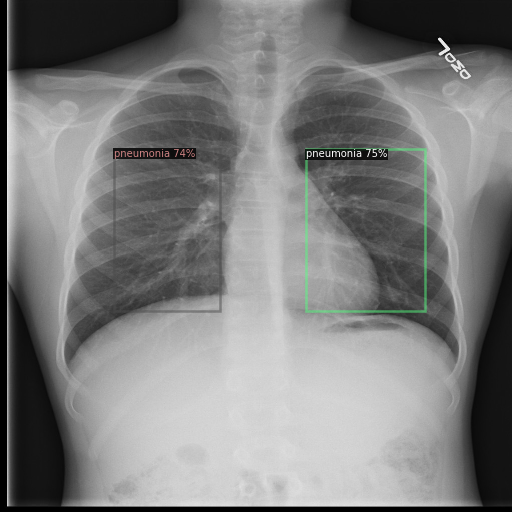

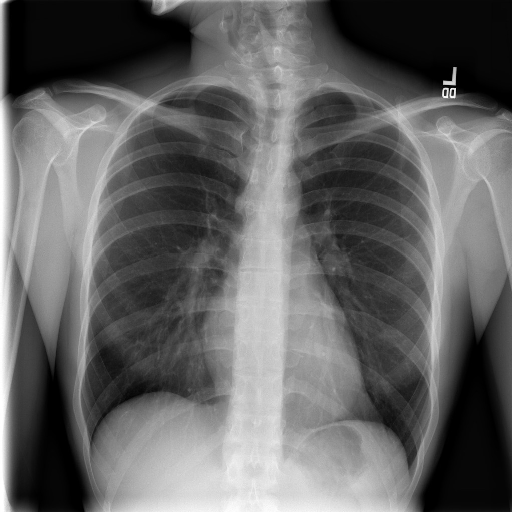

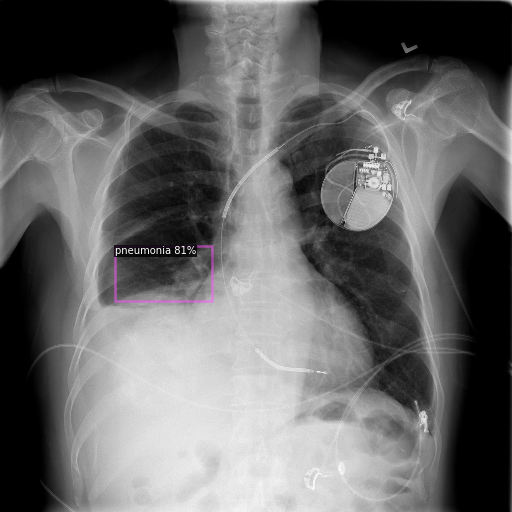

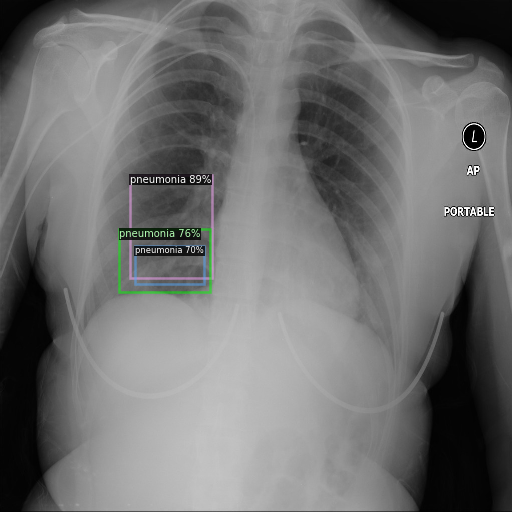

In [29]:
from detectron2.utils.visualizer import ColorMode

for file in random.sample(get_test_files(data_dir+'/test'), 10):      
    im = cv2.imread(file)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=pnuemonia_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))   
    cv2_imshow(out.get_image()[:, :, ::-1])